In [1]:
%matplotlib inline
import copy
import numpy as np
import matplotlib.pyplot as plt


In [2]:
from p2ch10.dsets import getNoduleInfoList, getCt
from util.util import xyz2irc
noduleInfo_list = getNoduleInfoList(requireDataOnDisk_bool=False)
noduleInfo_list[0]


NoduleInfoTuple(isMalignant_bool=True, diameter_mm=32.27003025, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.287966244644280690737019247886', center_xyz=(67.61451718, 85.02525992, -109.8084416))

In [13]:
series_list = sorted(set(t.series_uid for t in noduleInfo_list))
row_min = 999
col_min = 999
row_max = 0
col_max = 0

# This will take a while to run!
for series_uid in series_list:
    ct = getCt(series_uid)
    row_min = min(ct.maskMin_irc.row, row_min)
    col_min = min(ct.maskMin_irc.col, col_min)
    row_max = max(ct.maskMax_irc.row, row_max)
    col_max = max(ct.maskMax_irc.col, col_max)
  
print(series_uid, row_min, col_min, row_max, col_max)
    

1.3.6.1.4.1.14519.5.2.1.6279.6001.997611074084993415992563148335 30 11 480 500


In [4]:
def transparent_cmap(cmap, N=255):
    "Copy colormap and set alpha values"

    mycmap = copy.deepcopy(cmap)
    mycmap._init()
    mycmap._lut[:,-1] = np.linspace(0, 0.75, N+4)
    return mycmap
tgray = transparent_cmap(plt.cm.gray)
tpurp = transparent_cmap(plt.cm.Purples)
tblue = transparent_cmap(plt.cm.Blues)
tgreen = transparent_cmap(plt.cm.Greens)
torange = transparent_cmap(plt.cm.Oranges)
tred = transparent_cmap(plt.cm.Reds)


clim=(0.0, 1.3)
layer_list = [
    ('dense_mask', lambda ct: ct.dense_mask), 
    ('denoise_mask', lambda ct: ct.denoise_mask),
    ('tissue_mask', lambda ct: ct.tissue_mask), 
    ('body_mask', lambda ct: ct.body_mask), 
    ('air_mask', lambda ct: ct.air_mask), 
    ('lung_mask', lambda ct: ct.lung_mask), 
    ('benign_mask', lambda ct: ct.benign_mask), 
    ('malignant_mask', lambda ct: ct.malignant_mask), 
]
start_ndx = 3

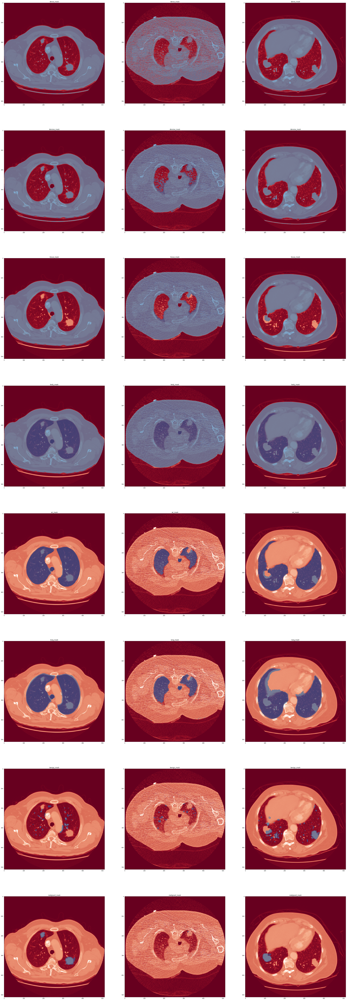

In [5]:
ct_list = []
for nit_ndx in range(start_ndx, start_ndx+3):
    noduleInfo_tup = noduleInfo_list[nit_ndx]
    ct = getCt(noduleInfo_tup.series_uid)
    center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
    
    ct_list.append((ct, center_irc))
start_ndx = nit_ndx + 1

fig = plt.figure(figsize=(50,150))
subplot_ndx = 0 
for title_str, layer_func in layer_list:
    for ct, center_irc in ct_list:    
        subplot_ndx += 1
        subplot = fig.add_subplot(len(layer_list), len(ct_list), subplot_ndx)
        subplot.set_title(title_str)
        
        plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='RdGy')
        plt.imshow(layer_func(ct)[int(center_irc.index)], clim=clim, cmap=tblue)
        

In [6]:
nit_ndx = 0
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)


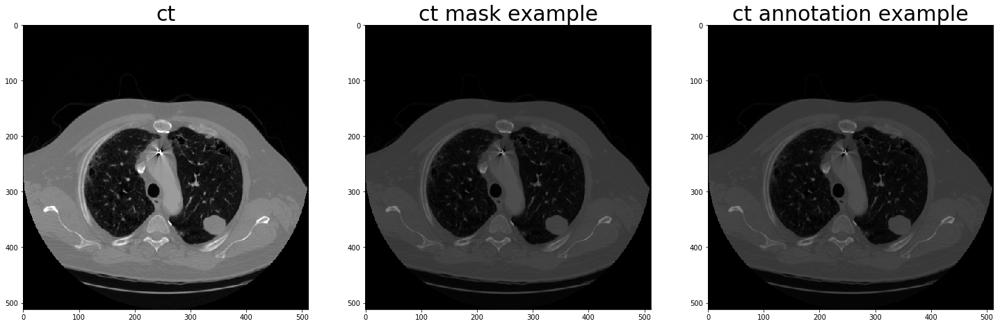

In [7]:
fig = plt.figure(figsize=(25,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('ct', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 2), cmap='gray')

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('ct mask example', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')

subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('ct annotation example', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
        

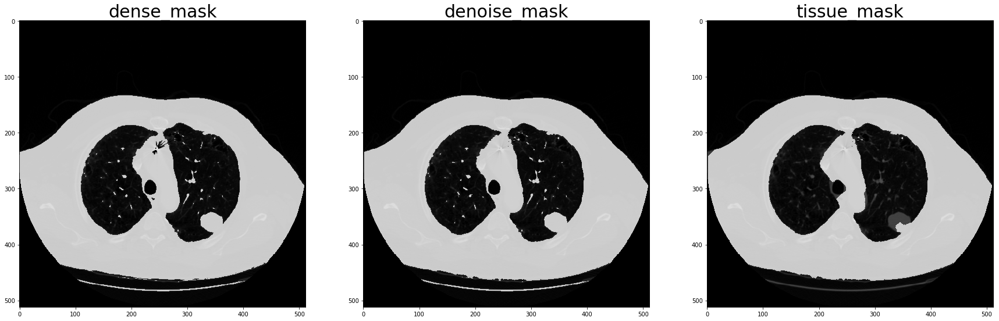

In [8]:
fig = plt.figure(figsize=(30,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('dense mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.dense_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('denoise mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.denoise_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('tissue mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.tissue_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)


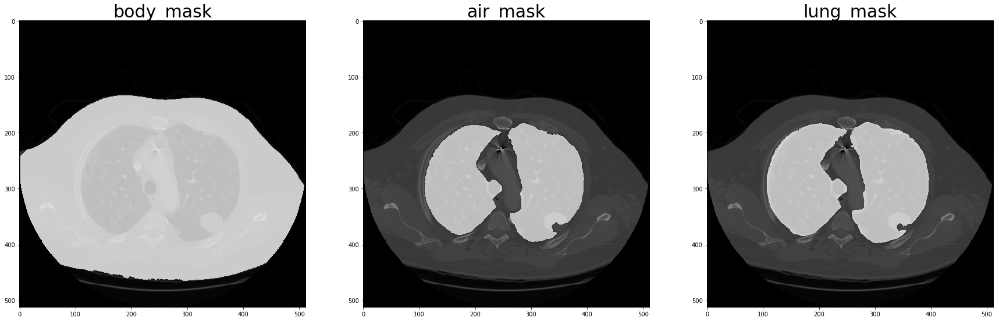

In [9]:
fig = plt.figure(figsize=(30,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('body mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.body_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('air mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.air_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('lung mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.lung_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)


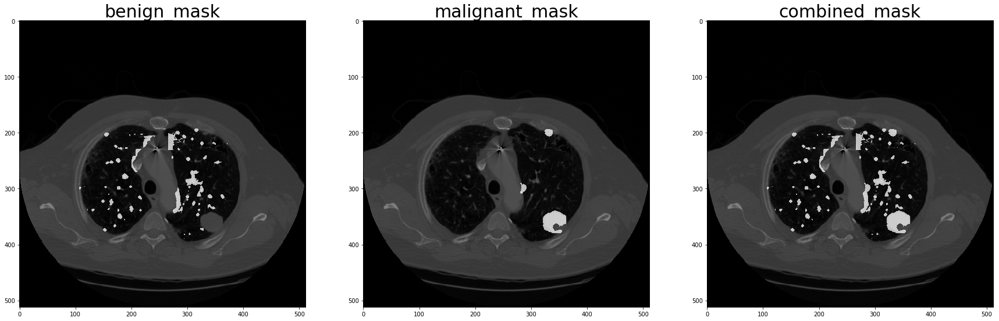

In [10]:
fig = plt.figure(figsize=(30,10))

subplot = fig.add_subplot(1, 3, 1)
subplot.set_title('benign mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.benign_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 3, 2)
subplot.set_title('malignant mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.malignant_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

combined_mask = ct.benign_mask | ct.malignant_mask
subplot = fig.add_subplot(1, 3, 3)
subplot.set_title('combined mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(combined_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)


NoduleInfoTuple(isMalignant_bool=True, diameter_mm=27.44242293, series_uid='1.3.6.1.4.1.14519.5.2.1.6279.6001.943403138251347598519939390311', center_xyz=(-45.29440163, 74.86925386, -97.52812481)) center_irc IrcTuple(index=170.577500152, row=189.7025961171893, col=329.2666153338636)


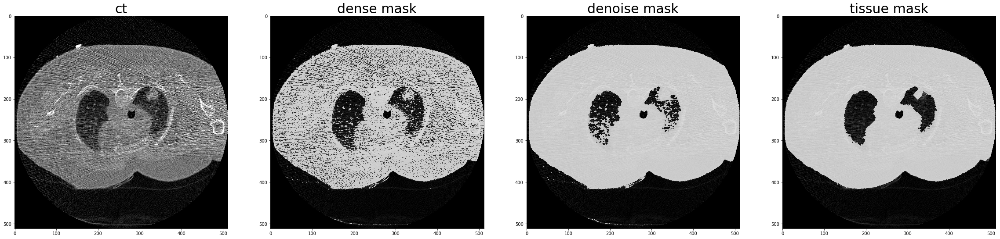

In [7]:
nit_ndx = 4
noduleInfo_tup = noduleInfo_list[nit_ndx]
ct = getCt(noduleInfo_tup.series_uid)
center_irc = xyz2irc(noduleInfo_tup.center_xyz, ct.origin_xyz, ct.vxSize_xyz, ct.direction_tup)
print(noduleInfo_tup, 'center_irc', center_irc)

fig = plt.figure(figsize=(40,10))

subplot = fig.add_subplot(1, 4, 1)
subplot.set_title('ct', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 2), cmap='gray')

subplot = fig.add_subplot(1, 4, 2)
subplot.set_title('dense mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.dense_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 3)
subplot.set_title('denoise mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.denoise_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)

subplot = fig.add_subplot(1, 4, 4)
subplot.set_title('tissue mask', fontsize=30)
plt.imshow(ct.ary[int(center_irc.index)], clim=(0, 4), cmap='gray')
plt.imshow(ct.tissue_mask[int(center_irc.index)], clim=(0,1), cmap=tgray)
